In [ ]:
import torch
import numpy as np
from scipy.signal import find_peaks


data = torch.load("xrd_RRUFF_dataset_normalized.pt")
# Assume `data` is your tensor of shape (1362, 4500)
# Convert to numpy for processing with scipy
data_np = data['patterns'].numpy()

# Prepare an empty tensor to store the result
peak_only_data = np.zeros_like(data_np)

# Loop through each row (spectrum)
for i in range(data_np.shape[0]):
    row = data_np[i]
    
    # Find peaks (customize parameters if needed)
    peaks, _ = find_peaks(row)
    #peaks, _ = find_peaks(row, height=0.1, distance=10, prominence=0.05)
    # Keep only peak values
    peak_only_data[i, peaks] = row[peaks]

# Convert back to torch tensor
peak_only_tensor = torch.tensor(peak_only_data)

print(peak_only_tensor.shape)


torch.Size([1362, 4500])


In [ ]:
data
torch.save(data, "xrd_RRUFF_dataset_normalized_with_peaks.pt")

# read csv "matching_compositions.csv" Use cod_id and RRUFFID as 
Format of 
RRUFFID,normalized_formula_df_rruff,normalized_formula_df_cod,composition_df,cod_id
R080016,Ag2S,Ag2S,"{'Ag': 2.0, 'S': 1.0}",1011337
R080016,Ag2S,Ag2S,"{'Ag': 2.0, 'S': 1.0}",9000253
R050488,ZrSiO4,O4SiZr,"{'Zr': 1.0, 'Si': 1.0, 'O': 4.0}",9002558
...

data_rruff = torch.load( "data/xrd_RRUFF_dataset_normalized_with_peaks.pt")

data_rruff['peaks'] has the peaks of RRUFFID
data_rruff['filenames'] has the RRUFFID


data_cod = torch.load("data/xrd_patterns_final/COD_xrd_patterns_and_ID.pt")

data_cod['patterns'] = has the xrd peaks 460k samples
data_cod['filenames'] = has cod_id 460k

both .pt files the order of the patterns and filenames make the connection.

Okay firstly filter out data_cod only the relevant cifs in the data_cod.

Secondly make a faiss database and I want to se which files are approximetly close to eachother. This should output for each unique ruff file x number of unique RUFF files. 
Lastly also give which RUFFID is closes to cod_id from the csv file.

Give output of the pairs and what the distance between the two vectors

In [1]:
import torch
import pandas as pd
import numpy as np
import json
from collections import defaultdict

# First, install FAISS for GPU if not already installed
try:
    import faiss
    print("Successfully imported FAISS")
except ImportError:
    print("FAISS not found. Please install FAISS with GPU support:")
    print("conda install -c pytorch faiss-gpu")
    print("or")
    print("pip install faiss-gpu")
    import sys
    sys.exit(1)

# Check if GPU is available
gpu_resources = None
try:
    ngpus = faiss.get_num_gpus()
    print(f"Number of GPUs detected: {ngpus}")
    if ngpus > 0:
        gpu_resources = [faiss.StandardGpuResources() for i in range(min(ngpus, 2))]  # Limit to 2 GPUs
        print("GPU resources initialized")
except:
    print("No GPU support in FAISS or no GPUs available. Using CPU version.")
    ngpus = 0

# Step 1: Load the datasets
print("Loading datasets...")
data_rruff = torch.load("data/xrd_RRUFF_dataset_normalized_with_peaks.pt")
data_cod = torch.load("data/xrd_patterns_final/COD_xrd_patterns_and_ID.pt")

# Load CSV with matching compositions
df_compositions = pd.read_csv("matching_compositions.csv")
print(f"Loaded {len(data_rruff['filenames'])} RRUFF patterns and {len(data_cod['filenames'])} COD patterns")
print(f"CSV contains {len(df_compositions)} rows with {df_compositions['cod_id'].nunique()} unique COD IDs")

# Step 2: Filter data_cod to include only the relevant CIFs from the CSV
print("Filtering COD dataset...")

# Convert cod_id to strings for matching
df_compositions['cod_id'] = df_compositions['cod_id'].astype(str)
relevant_cod_ids = set(df_compositions['cod_id'])

# Create a mapping from cod_id to its index in data_cod
cod_id_to_index = {}

# Print some debug information
print(f"Sample COD filename: {data_cod['filenames'][0]}")
print(f"Sample COD ID from CSV: {list(relevant_cod_ids)[0]}")

# Try different ID formats to find a match
for i, cod_id in enumerate(data_cod['filenames']):
    cod_id_str = str(cod_id)
    
    # Strip any prefix or suffix to get the bare ID
    bare_id = cod_id_str
    
    # Check for common prefixes
    for prefix in ["COD_", "cod_"]:
        if bare_id.startswith(prefix):
            bare_id = bare_id[len(prefix):]
    
    # Check for common suffixes
    if bare_id.endswith(".cif"):
        bare_id = bare_id[:-4]
    
    # Store both the original and stripped forms
    cod_id_to_index[bare_id] = i
    cod_id_to_index[cod_id_str] = i
    
    # Also store without leading zeros
    cod_id_to_index[bare_id.lstrip("0")] = i

# Get indices of relevant COD patterns
relevant_cod_indices = []
for cod_id in relevant_cod_ids:
    # Try different formats
    formats_to_try = [
        cod_id,
        cod_id.lstrip("0"),
        f"{int(cod_id):d}" if cod_id.isdigit() else cod_id
    ]
    
    for format_id in formats_to_try:
        if format_id in cod_id_to_index:
            relevant_cod_indices.append(cod_id_to_index[format_id])
            break

print(f"Found {len(relevant_cod_indices)} matching COD patterns out of {len(relevant_cod_ids)} relevant COD IDs")

# Remove duplicates from relevant_cod_indices
relevant_cod_indices = list(set(relevant_cod_indices))
print(f"After removing duplicates: {len(relevant_cod_indices)} unique COD patterns")

# Filter data_cod patterns
if len(relevant_cod_indices) > 0:
    filtered_cod_patterns = [data_cod['patterns'][i] for i in relevant_cod_indices]
    filtered_cod_ids = [data_cod['filenames'][i] for i in relevant_cod_indices]
    print(f"Successfully filtered COD patterns")
else:
    print("No matching COD patterns found! Cannot proceed with similarity search.")
    import sys
    sys.exit(1)

# Step 3: Create RRUFF ID to index mapping
rruff_id_to_index = {}
for i, filename in enumerate(data_rruff['filenames']):
    rruff_id = filename  # Assuming filenames are the RRUFF IDs
    rruff_id_to_index[rruff_id] = i

# Check how many RRUFF IDs from the CSV are in the dataset
rruff_ids_in_csv = set(df_compositions['RRUFFID'])
rruff_ids_in_dataset = set(rruff_id_to_index.keys())
common_rruff_ids = rruff_ids_in_csv.intersection(rruff_ids_in_dataset)
print(f"Found {len(common_rruff_ids)} common RRUFF IDs between CSV and dataset")

# Step 4: Process RRUFF patterns
print("Processing RRUFF patterns...")
rruff_patterns = []
rruff_ids = []

# Use only the common RRUFF IDs
for rruff_id in common_rruff_ids:
    idx = rruff_id_to_index[rruff_id]
    pattern = data_rruff['peaks'][idx]
    
    # Convert pattern to a fixed-length vector
    if isinstance(pattern, torch.Tensor):
        pattern_vector = pattern.detach().cpu().numpy()
    else:
        pattern_vector = np.array(pattern, dtype=np.float32)
        
    rruff_patterns.append(pattern_vector)
    rruff_ids.append(rruff_id)

print(f"Processed {len(rruff_patterns)} RRUFF patterns")

# Check if we have any patterns to work with
if len(rruff_patterns) == 0:
    print("No RRUFF patterns found! Cannot proceed with similarity search.")
    import sys
    sys.exit(1)

# Process COD patterns
print("Processing COD patterns...")
cod_patterns = []
cod_ids = []

for i, cod_id in enumerate(filtered_cod_ids):
    pattern = filtered_cod_patterns[i]
    
    # Convert pattern to a fixed-length vector
    if isinstance(pattern, torch.Tensor):
        pattern_vector = pattern.detach().cpu().numpy()
    else:
        pattern_vector = np.array(pattern, dtype=np.float32)
        
    cod_patterns.append(pattern_vector)
    cod_ids.append(str(cod_id))

print(f"Processed {len(cod_patterns)} COD patterns")

# Check dimensions of the patterns
if len(rruff_patterns) > 0 and len(cod_patterns) > 0:
    print(f"RRUFF pattern shape: {rruff_patterns[0].shape}")
    print(f"COD pattern shape: {cod_patterns[0].shape}")
    
    # Standardize pattern lengths if needed
    # Find maximum length across both datasets
    max_length_rruff = max(pattern.shape[0] for pattern in rruff_patterns)
    max_length_cod = max(pattern.shape[0] for pattern in cod_patterns)
    max_length = max(max_length_rruff, max_length_cod)
    
    # Pad RRUFF patterns
    padded_rruff = np.zeros((len(rruff_patterns), max_length), dtype=np.float32)
    for i, pattern in enumerate(rruff_patterns):
        length = pattern.shape[0]
        padded_rruff[i, :length] = pattern
    
    # Pad COD patterns
    padded_cod = np.zeros((len(cod_patterns), max_length), dtype=np.float32)
    for i, pattern in enumerate(cod_patterns):
        length = pattern.shape[0]
        padded_cod[i, :length] = pattern
    
    # Replace with padded versions
    rruff_patterns = padded_rruff
    cod_patterns = padded_cod
    
    print(f"Standardized pattern length to {max_length}")
    
    # Normalize patterns
    faiss.normalize_L2(rruff_patterns)
    faiss.normalize_L2(cod_patterns)
    
    # Create FAISS index for COD patterns
    print("Creating FAISS index for COD patterns...")
    dimension = cod_patterns.shape[1]
    index_cod = faiss.IndexFlatIP(dimension)  # Inner product for cosine similarity
    
    # Use GPU if available
    if ngpus > 0:
        print("Using GPU for COD index")
        index_cod = faiss.index_cpu_to_gpu(gpu_resources[0], 0, index_cod)
    
    index_cod.add(cod_patterns)
    
    # Step 5: Find closest COD patterns for each RRUFF pattern based on the CSV
    print("Finding closest COD patterns for each RRUFF ID based on CSV relationships...")
    
    # Create a mapping from RRUFF ID to its COD IDs from the CSV
    rruff_to_cod_from_csv = defaultdict(list)
    for _, row in df_compositions.iterrows():
        rruff_id = row['RRUFFID']
        cod_id = row['cod_id']
        if rruff_id in common_rruff_ids:  # Only consider RRUFFs we have in the dataset
            rruff_to_cod_from_csv[rruff_id].append(cod_id)
    
    # Results dictionary
    rruff_to_cod_distances = {}
    
    # For each RRUFF ID, find distances to its corresponding COD IDs from the CSV
    for i, rruff_id in enumerate(rruff_ids):
        related_cod_ids = rruff_to_cod_from_csv.get(rruff_id, [])
        
        if not related_cod_ids:
            print(f"No related COD IDs found in CSV for RRUFF ID: {rruff_id}")
            continue
        
        query_vector = rruff_patterns[i].reshape(1, -1)
        
        # Get the indices of the corresponding COD patterns
        related_cod_indices = []
        
        for related_cod_id in related_cod_ids:
            # Try different formats for matching
            formats_to_try = [
                related_cod_id,
                related_cod_id.lstrip("0"),
                f"{int(related_cod_id):d}" if related_cod_id.isdigit() else related_cod_id
            ]
            
            found = False
            for format_id in formats_to_try:
                matching_indices = [j for j, cod_id in enumerate(cod_ids) 
                                   if format_id in cod_id or cod_id in format_id]
                
                if matching_indices:
                    related_cod_indices.extend(matching_indices)
                    found = True
                    break
            
            if not found:
                print(f"Could not find COD ID {related_cod_id} in the filtered dataset")
        
        if not related_cod_indices:
            print(f"No matches found for any related COD IDs for RRUFF ID: {rruff_id}")
            continue
        
        # Remove duplicates
        related_cod_indices = list(set(related_cod_indices))
        
        # Calculate distances to each related COD pattern
        related_cod_patterns = np.vstack([cod_patterns[idx].reshape(1, -1) for idx in related_cod_indices])
        distances = np.zeros(len(related_cod_indices))
        
        for j, idx in enumerate(related_cod_indices):
            # Calculate cosine distance manually (1 - cosine similarity)
            # For normalized vectors, we can use inner product for cosine similarity
            similarity = np.dot(query_vector, cod_patterns[idx]) / (
                np.linalg.norm(query_vector) * np.linalg.norm(cod_patterns[idx]))
            distance = 1.0 - similarity
            distances[j] = distance
        
        # Store the results
        rruff_to_cod_distances[rruff_id] = [
            {
                "cod_id": cod_ids[related_cod_indices[j]],
                "distance": float(distances[j]),
                "in_csv": True
            }
            for j in range(len(related_cod_indices))
        ]
    
    # Step 6: Output results
    print("\nRRUFF-COD Pattern Distances:")
    for rruff_id, cod_matches in rruff_to_cod_distances.items():
        print(f"\nRRUFF ID: {rruff_id}")
        
        # Sort by distance (closest first)
        sorted_matches = sorted(cod_matches, key=lambda x: x["distance"])
        
        for i, match in enumerate(sorted_matches):
            print(f"  {i+1}. COD ID: {match['cod_id']}, Distance: {match['distance']:.4f}")
    
    # Save results to JSON for further analysis
    with open("xrd_similarity_results.json", "w") as f:
        json.dump(rruff_to_cod_distances, f, indent=4)
    
    print("\nResults saved to xrd_similarity_results.json")
else:
    print("Either no RRUFF patterns or no COD patterns available for similarity search!")

Successfully imported FAISS
Number of GPUs detected: 1
GPU resources initialized
Loading datasets...
Loaded 1362 RRUFF patterns and 436196 COD patterns
CSV contains 13763 rows with 3659 unique COD IDs
Filtering COD dataset...
Sample COD filename: 1000000.cif
Sample COD ID from CSV: 9011466
Found 3585 matching COD patterns out of 3659 relevant COD IDs
After removing duplicates: 3585 unique COD patterns
Successfully filtered COD patterns
Found 598 common RRUFF IDs between CSV and dataset
Processing RRUFF patterns...
Processed 598 RRUFF patterns
Processing COD patterns...
Processed 3585 COD patterns
RRUFF pattern shape: (4500,)
COD pattern shape: (4500,)
Standardized pattern length to 4500
Creating FAISS index for COD patterns...
Using GPU for COD index
Finding closest COD patterns for each RRUFF ID based on CSV relationships...


/tmp/ipykernel_304677/850124132.py:277: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  distances[j] = distance
/tmp/ipykernel_304677/850124132.py:274: RuntimeWarning: invalid value encountered in divide
  similarity = np.dot(query_vector, cod_patterns[idx]) / (


Could not find COD ID 1010753 in the filtered dataset
Could not find COD ID 2300703 in the filtered dataset
Could not find COD ID 4349856 in the filtered dataset
Could not find COD ID 1010753 in the filtered dataset
Could not find COD ID 1010760 in the filtered dataset
Could not find COD ID 1011020 in the filtered dataset
Could not find COD ID 1010765 in the filtered dataset
Could not find COD ID 1010760 in the filtered dataset
Could not find COD ID 1011170 in the filtered dataset
Could not find COD ID 7224240 in the filtered dataset
Could not find COD ID 7224241 in the filtered dataset
Could not find COD ID 7224242 in the filtered dataset
Could not find COD ID 7224243 in the filtered dataset
Could not find COD ID 1544611 in the filtered dataset
Could not find COD ID 1544612 in the filtered dataset
Could not find COD ID 1544613 in the filtered dataset
Could not find COD ID 1546345 in the filtered dataset
Could not find COD ID 4003210 in the filtered dataset
Could not find COD ID 101095

In [3]:

# Create a list to hold all rows for the CSV
csv_rows = []

for rruff_id, cod_matches in rruff_to_cod_distances.items():
    print(f"\nRRUFF ID: {rruff_id}")
    
    # Sort by distance (closest first)
    sorted_matches = sorted(cod_matches, key=lambda x: x["distance"])
    
    for i, match in enumerate(sorted_matches):
        print(f"  {i+1}. COD ID: {match['cod_id']}, Distance: {match['distance']:.4f}")
        
        # Add to CSV rows
        csv_rows.append({
            "RRUFFID": rruff_id,
            "cod_id": match["cod_id"],
            "distance": match["distance"],
            "rank": i+1  # Rank of this match based on distance
        })

# Save results to CSV
csv_file = "xrd_similarity_results.csv"
pd.DataFrame(csv_rows).to_csv(csv_file, index=False)

print(f"\nResults saved to {csv_file}")

# Also save as JSON for reference
with open("xrd_similarity_results.json", "w") as f:
    json.dump(rruff_to_cod_distances, f, indent=2)

print("Results also saved as JSON to xrd_similarity_results.json")



RRUFF ID: R050278
  1. COD ID: 9003365.cif, Distance: 0.3154
  2. COD ID: 9003364.cif, Distance: 0.3198
  3. COD ID: 9003362.cif, Distance: 0.9118
  4. COD ID: 9003363.cif, Distance: 0.9119
  5. COD ID: 9003361.cif, Distance: 0.9722
  6. COD ID: 9004242.cif, Distance: 0.9722
  7. COD ID: 9003372.cif, Distance: 0.9929
  8. COD ID: 9003371.cif, Distance: 0.9936
  9. COD ID: 9003374.cif, Distance: 0.9943
  10. COD ID: 9003368.cif, Distance: 0.9944
  11. COD ID: 9003369.cif, Distance: 0.9965
  12. COD ID: 9003370.cif, Distance: 0.9966
  13. COD ID: 9003375.cif, Distance: 0.9966
  14. COD ID: 9003367.cif, Distance: 0.9972
  15. COD ID: 9003366.cif, Distance: 0.9973
  16. COD ID: 9003373.cif, Distance: 0.9976
  17. COD ID: 9003376.cif, Distance: 0.9980
  18. COD ID: 9003377.cif, Distance: 0.9983

RRUFF ID: R050360
  1. COD ID: 9011676.cif, Distance: 0.8843
  2. COD ID: 9011675.cif, Distance: 0.9014
  3. COD ID: 9011672.cif, Distance: 0.9839
  4. COD ID: 9011666.cif, Distance: 0.9856
  5. CO

Total matches: 13556
Rank 1 matches: 598
Distance statistics for rank 1 matches:
  Min: 0.0816
  Max: 1.0000
  Mean: 0.7506
  Median: 0.8300
  Standard deviation: 0.2308
Histogram saved to rank1_distance_histogram.png


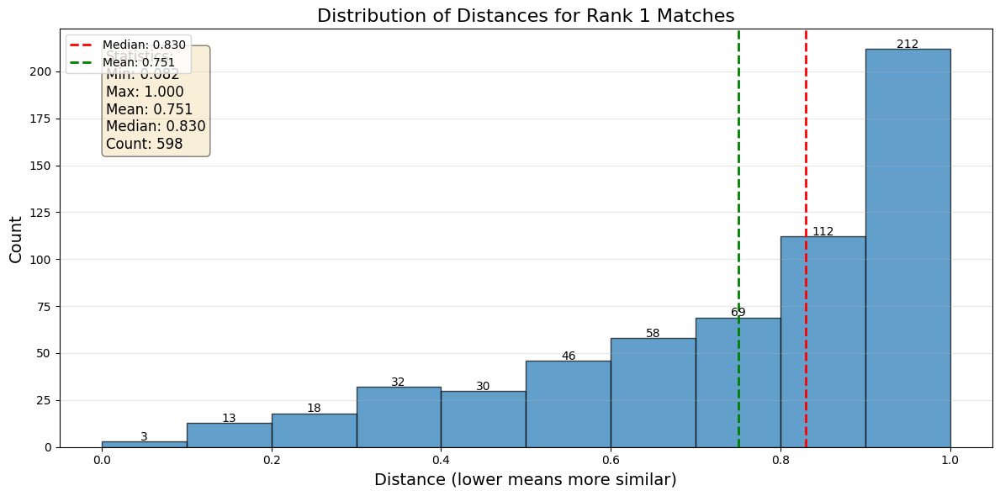

Scatter plot saved to rank1_distance_scatter.png

Best Matches (Lowest Distance):
1. RRUFF ID: R050127, COD ID: 9015390.cif, Distance: 0.0816
2. RRUFF ID: R060648, COD ID: 9001578.cif, Distance: 0.0835
3. RRUFF ID: R060365, COD ID: 9017093.cif, Distance: 0.0837
4. RRUFF ID: R050125, COD ID: 9009666.cif, Distance: 0.1125
5. RRUFF ID: R050307, COD ID: 9000965.cif, Distance: 0.1174

Worst Matches (Highest Distance):
1. RRUFF ID: R050207, COD ID: 9012230.cif, Distance: 1.0000
2. RRUFF ID: R050206, COD ID: 9012230.cif, Distance: 1.0000
3. RRUFF ID: R050379, COD ID: 1562989.cif, Distance: 1.0000
4. RRUFF ID: R060750, COD ID: 1011107.cif, Distance: 1.0000
5. RRUFF ID: R050205, COD ID: 9012230.cif, Distance: 1.0000


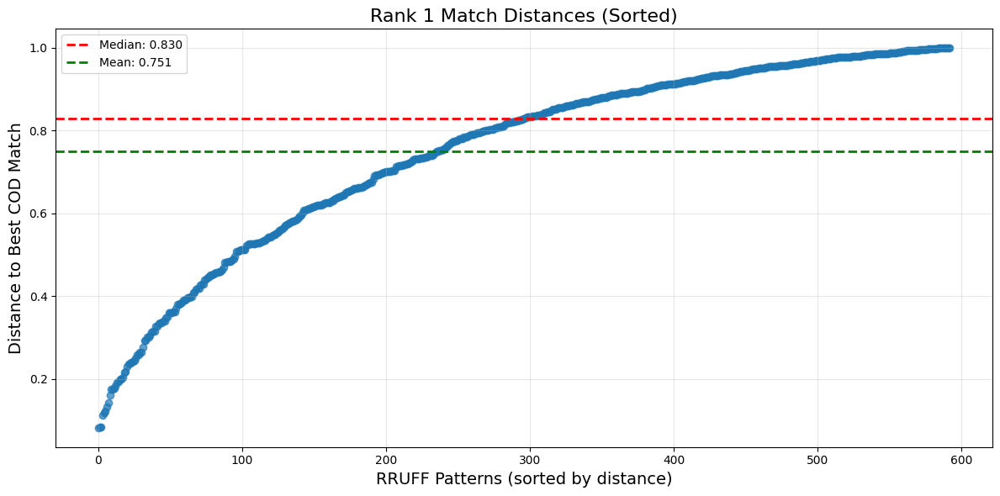

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# Check if the CSV file exists
csv_file = "xrd_similarity_results.csv"
if not os.path.exists(csv_file):
    print(f"CSV file {csv_file} does not exist. Please run the matching script first.")
    exit(1)

# Read the CSV file
df = pd.read_csv(csv_file)

# Filter to keep only rank 1 matches
rank_1_df = df[df['rank'] == 1]

print(f"Total matches: {len(df)}")
print(f"Rank 1 matches: {len(rank_1_df)}")

# Create histogram with bin size of 0.1
plt.figure(figsize=(12, 6))

# Calculate bin edges with 0.1 width
min_distance = min(rank_1_df['distance'])
max_distance = max(rank_1_df['distance'])
bin_min = np.floor(min_distance * 10) / 10  # Round down to nearest 0.1
bin_max = np.ceil(max_distance * 10) / 10   # Round up to nearest 0.1
bins = np.arange(bin_min, bin_max + 0.1, 0.1)

# Create the histogram
n, bins, patches = plt.hist(rank_1_df['distance'], bins=bins, edgecolor='black', alpha=0.7)

# Add labels to each bar
for i in range(len(n)):
    if n[i] > 0:  # Only label non-empty bins
        plt.text(bins[i] + 0.05, n[i] + 0.5, int(n[i]), ha='center')

# Customize the plot
plt.title('Distribution of Distances for Rank 1 Matches', fontsize=16)
plt.xlabel('Distance (lower means more similar)', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.grid(axis='y', alpha=0.3)

# Add median and mean lines
median_val = rank_1_df['distance'].median()
mean_val = rank_1_df['distance'].mean()

plt.axvline(median_val, color='red', linestyle='--', linewidth=2, label=f'Median: {median_val:.3f}')
plt.axvline(mean_val, color='green', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.3f}')

# Print statistics
print(f"Distance statistics for rank 1 matches:")
print(f"  Min: {min_distance:.4f}")
print(f"  Max: {max_distance:.4f}")
print(f"  Mean: {mean_val:.4f}")
print(f"  Median: {median_val:.4f}")
print(f"  Standard deviation: {rank_1_df['distance'].std():.4f}")

# Add distance distribution information in a box
textstr = f"Statistics:\n" \
          f"Min: {min_distance:.3f}\n" \
          f"Max: {max_distance:.3f}\n" \
          f"Mean: {mean_val:.3f}\n" \
          f"Median: {median_val:.3f}\n" \
          f"Count: {len(rank_1_df)}"

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.legend()
plt.tight_layout()

# Save the histogram
output_file = "rank1_distance_histogram.png"
plt.savefig(output_file, dpi=300)
print(f"Histogram saved to {output_file}")

# Show the histogram
plt.show()

# Also create a scatter plot of RRUFF IDs vs. their best match distance
plt.figure(figsize=(12, 6))

# Sort by distance for better visualization
sorted_df = rank_1_df.sort_values('distance')
x = np.arange(len(sorted_df))

plt.scatter(x, sorted_df['distance'], alpha=0.7)
plt.axhline(median_val, color='red', linestyle='--', linewidth=2, label=f'Median: {median_val:.3f}')
plt.axhline(mean_val, color='green', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.3f}')

plt.title('Rank 1 Match Distances (Sorted)', fontsize=16)
plt.xlabel('RRUFF Patterns (sorted by distance)', fontsize=14)
plt.ylabel('Distance to Best COD Match', fontsize=14)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()

scatter_file = "rank1_distance_scatter.png"
plt.savefig(scatter_file, dpi=300)
print(f"Scatter plot saved to {scatter_file}")

# If there are enough data points, create a visualization of the worst and best matches
if len(rank_1_df) >= 5:
    # Get the 5 best and 5 worst matches
    best_matches = rank_1_df.nsmallest(5, 'distance')
    worst_matches = rank_1_df.nlargest(5, 'distance')
    
    print("\nBest Matches (Lowest Distance):")
    for i, (_, row) in enumerate(best_matches.iterrows()):
        print(f"{i+1}. RRUFF ID: {row['RRUFFID']}, COD ID: {row['cod_id']}, Distance: {row['distance']:.4f}")
    
    print("\nWorst Matches (Highest Distance):")
    for i, (_, row) in enumerate(worst_matches.iterrows()):
        print(f"{i+1}. RRUFF ID: {row['RRUFFID']}, COD ID: {row['cod_id']}, Distance: {row['distance']:.4f}")

In [ ]:
import torch
import pandas as pd
import numpy as np
import os
import shutil
from collections import defaultdict

# Step 1: Load the datasets and matching results
print("Loading datasets and matching results...")

# Load RRUFF and COD datasets
data_rruff = torch.load("data/xrd_RRUFF_dataset_normalized_with_peaks.pt")
data_cod = torch.load("data/xrd_patterns_final/COD_xrd_patterns_and_ID.pt")

# Load results from similarity search
results_df = pd.read_csv("xrd_similarity_results.csv")

# Filter to get only rank 1 matches (best match for each RRUFF ID)
best_matches_df = results_df[results_df['rank'] == 1].copy()
print(f"Found {len(best_matches_df)} best matches (rank 1)")

# Step 2: Add COD IDs to RRUFF data
print("Adding COD IDs to RRUFF data...")

# Create mapping from RRUFF ID to best matching COD ID
rruff_to_cod_map = dict(zip(best_matches_df['RRUFFID'], best_matches_df['cod_id']))

# Create a new dictionary for the enhanced RRUFF dataset
enhanced_rruff_data = {
    'filenames': data_rruff['filenames'],
    'patterns' : data_rruff['patterns'],
    'peaks': data_rruff['peaks'],
    'best_matching_cod_ids': []  # New field for COD IDs
}

# Add best matching COD ID for each RRUFF ID
for rruff_id in data_rruff['filenames']:
    matching_cod_id = rruff_to_cod_map.get(rruff_id, None)
    enhanced_rruff_data['best_matching_cod_ids'].append(matching_cod_id)

# Save the enhanced RRUFF dataset
torch.save(enhanced_rruff_data, "data/xrd_RRUFF_dataset_with_cod_ids.pt")
print(f"Enhanced RRUFF dataset saved to data/xrd_RRUFF_dataset_with_cod_ids.pt")

# Step 3: Extract CIF files for training data
print("Preparing COD CIF files for training data...")

# Create a directory to store the selected CIF files if it doesn't exist
training_cif_dir = "training_cifs"
os.makedirs(training_cif_dir, exist_ok=True)

# Determine the source directory for CIF files (adjust as needed)
cod_cif_dir = "data/cod_cifs"  # Modify this to your actual CIF directory

# Get the COD IDs for the best matches
best_cod_ids = best_matches_df['cod_id'].tolist()

# Create a mapping from COD ID to index in the COD dataset
cod_id_to_index = {}
for i, cod_id in enumerate(data_cod['filenames']):
    cod_id_str = str(cod_id)
    
    # Try different formats to ensure matching
    formats = [
        cod_id_str,
        cod_id_str.lstrip('0'),
        f"{int(cod_id_str):d}" if cod_id_str.isdigit() else cod_id_str
    ]
    
    for format_id in formats:
        cod_id_to_index[format_id] = i


print(cod_id_to_index)
# Count how many COD IDs we found in the dataset
found_count = 0
not_found_count = 0
not_found_ids = []

# Create a new file with information about the training set
training_info = []

# Process each best-matching COD ID
for cod_id in best_cod_ids:
    found = False
    
    # Try different formats to find the COD ID in the dataset
    formats_to_try = [
        cod_id,
        cod_id.lstrip('0'),
        f"{int(cod_id):d}" if cod_id.isdigit() else cod_id
    ]
    
    for format_id in formats_to_try:
        if format_id in cod_id_to_index:
            idx = cod_id_to_index[format_id]
            found = True
            
            # Get the exact filename from the dataset
            exact_cod_id = data_cod['filenames'][idx]
            
            # Construct potential CIF filenames
            potential_cif_names = [
                f"{exact_cod_id}.cif",
                f"COD_{exact_cod_id}.cif",
                f"cod_{exact_cod_id}.cif",
                f"{cod_id}.cif",
                f"COD_{cod_id}.cif",
                f"cod_{cod_id}.cif"
            ]
            
            # Get the corresponding RRUFF ID
            rruff_id = best_matches_df[best_matches_df['cod_id'] == cod_id]['RRUFFID'].iloc[0]
            
            # Find the CIF file
            cif_found = False
            for cif_name in potential_cif_names:
                cif_path = os.path.join(cod_cif_dir, cif_name)
                if os.path.exists(cif_path):
                    # Copy the CIF file to the training directory
                    target_path = os.path.join(training_cif_dir, cif_name)
                    shutil.copy2(cif_path, target_path)
                    
                    # Add to training info
                    training_info.append({
                        'cod_id': cod_id,
                        'cif_file': cif_name,
                        'rruff_id': rruff_id,
                        'distance': best_matches_df[best_matches_df['cod_id'] == cod_id]['distance'].iloc[0]
                    })
                    
                    cif_found = True
                    break
            
            if not cif_found:
                print(f"Warning: CIF file for COD ID {cod_id} not found in {cod_cif_dir}")
                not_found_ids.append(cod_id)
                not_found_count += 1
            else:
                found_count += 1
            
            break
    
    if not found:
        print(f"Warning: COD ID {cod_id} not found in the COD dataset")
        not_found_ids.append(cod_id)
        not_found_count += 1

# Save the training info to a CSV file
training_info_df = pd.DataFrame(training_info)
training_info_df.to_csv("training_data_info.csv", index=False)

print(f"\nTraining data preparation completed:")
print(f"- Found {found_count} COD CIF files")
print(f"- Could not find {not_found_count} COD CIF files")
print(f"- Training info saved to training_data_info.csv")

if not_found_count > 0:
    print("\nCOD IDs not found:")
    for i, cod_id in enumerate(not_found_ids[:10]):
        print(f"  {i+1}. {cod_id}")
    
    if len(not_found_ids) > 10:
        print(f"  ... and {len(not_found_ids) - 10} more")

# Step 4: Create a combined dataset with paired RRUFF-COD patterns
print("\nCreating paired RRUFF-COD patterns dataset...")

paired_data = {
    'rruff_ids': [],
    'cod_ids': [],
    'rruff_patterns': [],
    'cod_patterns': [],
    'distances': []
}

# Get indices for the best matches
for _, row in best_matches_df.iterrows():
    rruff_id = row['RRUFFID']
    cod_id = row['cod_id']
    distance = row['distance']
    
    # Find indices
    rruff_idx = None
    cod_idx = None
    
    # Find RRUFF index
    for i, filename in enumerate(data_rruff['filenames']):
        if filename == rruff_id:
            rruff_idx = i
            break
    
    # Find COD index with flexible matching
    for format_id in [cod_id, cod_id.lstrip('0'), f"{int(cod_id):d}" if cod_id.isdigit() else cod_id]:
        if format_id in cod_id_to_index:
            cod_idx = cod_id_to_index[format_id]
            break
    
    # If both patterns found, add to paired data
    if rruff_idx is not None and cod_idx is not None:
        paired_data['rruff_ids'].append(rruff_id)
        paired_data['cod_ids'].append(cod_id)
        paired_data['rruff_patterns'].append(data_rruff['peaks'][rruff_idx])
        paired_data['cod_patterns'].append(data_cod['patterns'][cod_idx])
        paired_data['distances'].append(distance)

# Save the paired dataset
torch.save(paired_data, "data/rruff_cod_paired_patterns.pt")
print(f"Paired RRUFF-COD patterns dataset saved with {len(paired_data['rruff_ids'])} pairs")

print("\nAll training data preparation tasks completed successfully!")

Loading datasets and matching results...
Found 598 best matches (rank 1)
Adding COD IDs to RRUFF data...
Enhanced RRUFF dataset saved to data/xrd_RRUFF_dataset_with_cod_ids.pt
Preparing COD CIF files for training data...
{'1000000.cif': 0, '1000001.cif': 1, '1000004.cif': 2, '1000005.cif': 3, '1000006.cif': 4, '1000007.cif': 5, '1000008.cif': 6, '1000009.cif': 7, '1000010.cif': 8, '1000011.cif': 9, '1000012.cif': 10, '1000013.cif': 11, '1000014.cif': 12, '1000015.cif': 13, '1000016.cif': 14, '1000017.cif': 15, '1000018.cif': 16, '1000019.cif': 17, '1000020.cif': 18, '1000021.cif': 19, '1000022.cif': 20, '1000023.cif': 21, '1000024.cif': 22, '1000025.cif': 23, '1000026.cif': 24, '1000027.cif': 25, '1000029.cif': 26, '1000030.cif': 27, '1000031.cif': 28, '1000032.cif': 29, '1000033.cif': 30, '1000034.cif': 31, '1000035.cif': 32, '1000036.cif': 33, '1000037.cif': 34, '1000038.cif': 35, '1000039.cif': 36, '1000040.cif': 37, '1000041.cif': 38, '1000042.cif': 39, '1000043.cif': 40, '1000044.